<a href="https://colab.research.google.com/github/JABianchi/AI-Neural-Network-Lab/blob/main/CS3_AI_Model_Training_Tutorial_(JAB).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# I. TESTING AN AI MODEL
We will use a pre-trained YOLO model to various identify objects in a picture. (Hello)


*Note: YOLO ("You Only Look Once") AI models are real-time object detection systems widely used in current AI research.  *

## Step 1: Install Required Packages

In [ ]:
#Download Ultralytics package
%pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [ ]:
# Assign name for ultralytics package in this project
import ultralytics

## Step 2: Load the AI Model

In [ ]:
# Import YOLO package
from ultralytics import YOLO

# Load a pre-trained YOLO model
model = YOLO('yolov8n.pt')  #will download the pre-trained YOLO model if not already in the base folder ('content' for GColab)


In [ ]:
#check what classes of objects the model is looking for
model.model.names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

## Step 3: Use AI Model to make Predictions and Visualize them


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 238.9ms
Speed: 7.6ms preprocess, 238.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


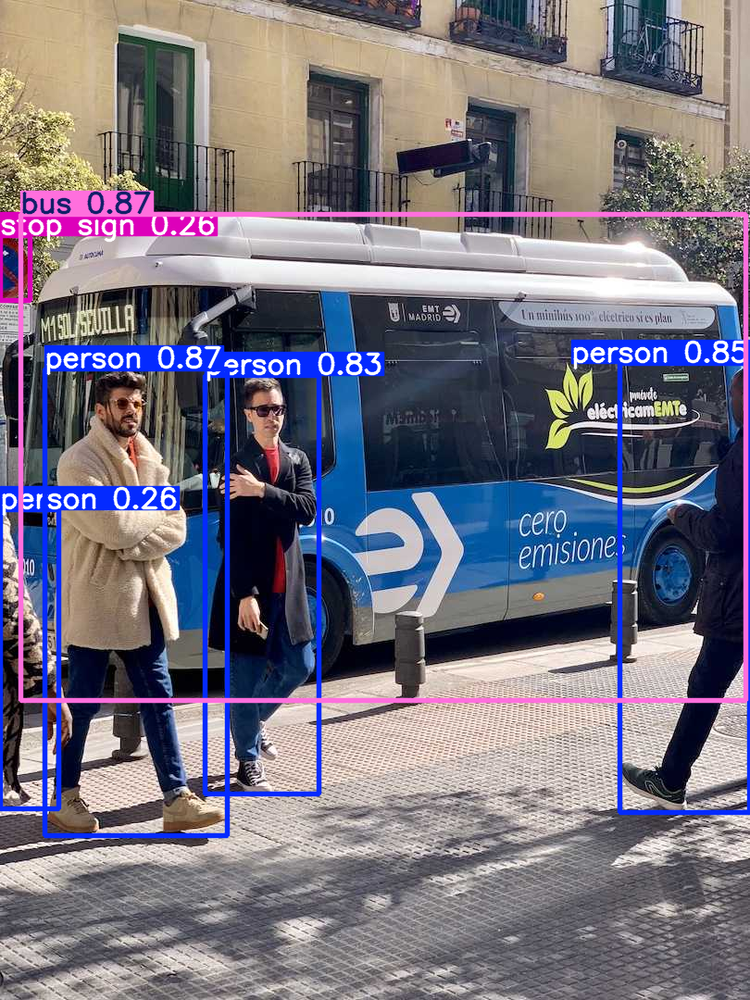

In [ ]:
#import Python Image Library
from PIL import Image

# Determine the image to use to test the model
testImage = 'https://ultralytics.com/images/bus.jpg'

# Ask the model to make to try to predict objects from an image
prediction1 = model(testImage)

#Display the picture with the model's predictions
Image.fromarray(prediction1[0].plot()[:,:,::-1])

# II. TRAINING AN AI MODEL
This time, we'll teach the model to look for something more specific than what it already knows.  This is called "training".

## Step 4: Acquire the Training Data
You will be provided with a [windows.zip file](https://drive.google.com/file/d/1F5dYebRCzpKq2cLsd7I8KXkhkisVEYMQ/view?usp=sharing).  Make sure the file is uploaded into the correct folder!

*   Google Colab - Upload into the **content** folder
*   Raspberry Pi - Upload to the base directory (ie. **Downloads**)



In [ ]:
#unzip the training data into the expected folder structure
!unzip windows.zip

Archive:  windows.zip
   creating: windows/
   creating: windows/images/
   creating: windows/images/train/
  inflating: windows/images/train/1.jpg  
  inflating: windows/images/train/2.jpg  
  inflating: windows/images/train/3.jpg  
  inflating: windows/images/train/4.jpg  
   creating: windows/images/val/
  inflating: windows/images/val/5.jpg  
  inflating: windows/images/val/6.jpg  
  inflating: windows/images/val/7.jpg  
  inflating: windows/images/val/8.jpg  
   creating: windows/labels/
   creating: windows/labels/train/
  inflating: windows/labels/train/1.txt  
  inflating: windows/labels/train/2.txt  
  inflating: windows/labels/train/3.txt  
  inflating: windows/labels/train/4.txt  
   creating: windows/labels/val/
  inflating: windows/labels/val/5.txt  
  inflating: windows/labels/val/6.txt  
  inflating: windows/labels/val/7.txt  
  inflating: windows/labels/val/8.txt  
  inflating: windows/windows.yaml    


## Step 5: Train the AI model to detect building windows


In [ ]:
#Indicate the configuration file (*.yaml) for how to train the model
configFile = 'windows/windows.yaml'

#Train the AI model to identify building windows
trainingOutput = model.train(data=configFile)

Ultralytics YOLOv8.2.70 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=windows/windows.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

100%|██████████| 755k/755k [00:00<00:00, 15.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/windows/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 369.68it/s]

train: New cache created: /content/windows/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/windows/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 398.40it/s]

val: New cache created: /content/windows/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      3.141      3.673      2.556        153        640: 100%|██████████| 1/1 [00:06<00:00,  6.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.45s/it]

                   all          4        145      0.015      0.124    0.00844    0.00199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      3.276      3.722      2.444        129        640: 100%|██████████| 1/1 [00:04<00:00,  4.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]

                   all          4        145     0.0125      0.103    0.00691    0.00152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      3.667      3.702      2.415        196        640: 100%|██████████| 1/1 [00:05<00:00,  5.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]

                   all          4        145     0.0192      0.159     0.0111     0.0025



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      3.326      3.683      2.417        169        640: 100%|██████████| 1/1 [00:04<00:00,  4.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all          4        145     0.0167      0.138    0.00952     0.0025



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      3.212      3.665      2.414        187        640: 100%|██████████| 1/1 [00:06<00:00,  6.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

                   all          4        145       0.01     0.0828    0.00546    0.00125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      3.596      3.646      2.264        261        640: 100%|██████████| 1/1 [00:05<00:00,  5.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.55s/it]

                   all          4        145     0.0133       0.11    0.00746    0.00194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      3.412       3.63      2.299        268        640: 100%|██████████| 1/1 [00:04<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]

                   all          4        145    0.00917     0.0759    0.00493    0.00127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      3.263      3.575       2.38        149        640: 100%|██████████| 1/1 [00:05<00:00,  5.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.91s/it]

                   all          4        145     0.0075     0.0621    0.00402   0.000968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      3.131      3.481      2.285        218        640: 100%|██████████| 1/1 [00:05<00:00,  5.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

                   all          4        145     0.0108     0.0897    0.00616    0.00123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      3.048      3.435      2.178        188        640: 100%|██████████| 1/1 [00:05<00:00,  5.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all          4        145       0.01     0.0828    0.00554   0.000989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      2.812      3.306      2.304        255        640: 100%|██████████| 1/1 [00:05<00:00,  5.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.79s/it]

                   all          4        145     0.0117     0.0966    0.00657    0.00131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      2.728      3.177      2.289        144        640: 100%|██████████| 1/1 [00:04<00:00,  4.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          4        145      0.015      0.124    0.00875    0.00162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      2.579      3.024      2.177        145        640: 100%|██████████| 1/1 [00:04<00:00,  4.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]

                   all          4        145     0.0183      0.152     0.0112    0.00271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      3.269       3.02      1.828        381        640: 100%|██████████| 1/1 [00:04<00:00,  4.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all          4        145     0.0225      0.186     0.0145    0.00379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      2.676      2.923      2.085        179        640: 100%|██████████| 1/1 [00:04<00:00,  4.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]

                   all          4        145     0.0233      0.193     0.0153    0.00396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      2.466      2.624      1.964        163        640: 100%|██████████| 1/1 [00:03<00:00,  3.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all          4        145      0.025      0.207     0.0169    0.00474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      2.339      2.431      1.856        176        640: 100%|██████████| 1/1 [00:03<00:00,  3.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]

                   all          4        145     0.0192      0.159     0.0126    0.00381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G       2.49      2.376       1.91        228        640: 100%|██████████| 1/1 [00:04<00:00,  4.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          4        145     0.0192      0.159     0.0126    0.00381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      2.572      2.628      2.135         92        640: 100%|██████████| 1/1 [00:03<00:00,  3.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]

                   all          4        145       0.02      0.166     0.0138    0.00454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G       2.32      2.114      1.761        215        640: 100%|██████████| 1/1 [00:05<00:00,  5.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          4        145       0.02      0.166     0.0138    0.00454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G       2.62      2.334      1.972        186        640: 100%|██████████| 1/1 [00:04<00:00,  4.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]

                   all          4        145       0.02      0.166     0.0138    0.00592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      2.461      2.129      1.739        368        640: 100%|██████████| 1/1 [00:05<00:00,  5.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

                   all          4        145       0.02      0.166     0.0138    0.00592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      2.071      2.088      1.814        179        640: 100%|██████████| 1/1 [00:04<00:00,  4.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]

                   all          4        145     0.0208      0.172     0.0149    0.00708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      2.398      2.033      1.826        159        640: 100%|██████████| 1/1 [00:04<00:00,  4.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all          4        145     0.0208      0.172     0.0149    0.00708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G      2.397      1.843      1.713        293        640: 100%|██████████| 1/1 [00:05<00:00,  5.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.80s/it]

                   all          4        145     0.0233      0.193     0.0421     0.0239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.945      1.791      1.703        131        640: 100%|██████████| 1/1 [00:03<00:00,  3.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all          4        145     0.0233      0.193     0.0421     0.0239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G       2.16      1.683       1.69        162        640: 100%|██████████| 1/1 [00:05<00:00,  5.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.73s/it]

                   all          4        145     0.0258      0.214      0.102     0.0477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      1.949      1.606       1.63        187        640: 100%|██████████| 1/1 [00:04<00:00,  4.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all          4        145     0.0258      0.214      0.102     0.0477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      2.207      1.764      1.647        178        640: 100%|██████████| 1/1 [00:04<00:00,  4.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]

                   all          4        145       0.03      0.248      0.155      0.064



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      1.937      1.582      1.608        174        640: 100%|██████████| 1/1 [00:04<00:00,  4.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all          4        145       0.03      0.248      0.155      0.064



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      2.016      1.466      1.526        254        640: 100%|██████████| 1/1 [00:05<00:00,  5.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.91s/it]

                   all          4        145     0.0342      0.283       0.21      0.086



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G      2.094      1.627      1.617        222        640: 100%|██████████| 1/1 [00:04<00:00,  4.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all          4        145     0.0342      0.283       0.21      0.086



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      2.291      1.485      1.519        334        640: 100%|██████████| 1/1 [00:06<00:00,  6.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

                   all          4        145     0.0606      0.276      0.232     0.0959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G      1.896      1.527       1.52        186        640: 100%|██████████| 1/1 [00:04<00:00,  4.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

                   all          4        145     0.0606      0.276      0.232     0.0959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G       1.95      1.351      1.474        221        640: 100%|██████████| 1/1 [00:06<00:00,  6.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]

                   all          4        145      0.431      0.255       0.25      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G      1.738      1.583      1.585        121        640: 100%|██████████| 1/1 [00:03<00:00,  3.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

                   all          4        145      0.431      0.255       0.25      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      1.797      1.323       1.43        175        640: 100%|██████████| 1/1 [00:05<00:00,  5.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

                   all          4        145      0.763      0.221      0.288      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G      1.893      1.407      1.542        194        640: 100%|██████████| 1/1 [00:05<00:00,  5.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]

                   all          4        145      0.763      0.221      0.288      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G       1.73      1.317      1.444        213        640: 100%|██████████| 1/1 [00:05<00:00,  5.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          4        145      0.753      0.228       0.31      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      1.917      1.376      1.527        177        640: 100%|██████████| 1/1 [00:03<00:00,  3.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.00s/it]

                   all          4        145      0.753      0.228       0.31      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G      1.993      1.469      1.562        327        640: 100%|██████████| 1/1 [00:06<00:00,  6.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]

                   all          4        145      0.691      0.255      0.331      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G      1.618      1.235      1.302        185        640: 100%|██████████| 1/1 [00:04<00:00,  4.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]

                   all          4        145      0.691      0.255      0.331      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G      1.753      1.236       1.41        211        640: 100%|██████████| 1/1 [00:04<00:00,  4.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all          4        145      0.711      0.297      0.348      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      1.786       1.17      1.343        257        640: 100%|██████████| 1/1 [00:04<00:00,  4.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]

                   all          4        145      0.711      0.297      0.348      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G      1.697      1.195      1.337        170        640: 100%|██████████| 1/1 [00:04<00:00,  4.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all          4        145      0.705      0.297      0.356      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      1.714       1.19      1.379        280        640: 100%|██████████| 1/1 [00:04<00:00,  4.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]

                   all          4        145      0.705      0.297      0.356      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G      1.763      1.156      1.378        190        640: 100%|██████████| 1/1 [00:03<00:00,  3.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          4        145      0.708      0.301      0.375      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      1.608      1.194      1.259        140        640: 100%|██████████| 1/1 [00:03<00:00,  3.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]

                   all          4        145      0.708      0.301      0.375      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G      1.626       1.12      1.328        173        640: 100%|██████████| 1/1 [00:06<00:00,  6.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.90s/it]

                   all          4        145      0.712      0.289      0.404      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G      1.536      1.029       1.23        228        640: 100%|██████████| 1/1 [00:05<00:00,  5.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all          4        145      0.712      0.289      0.404      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G      1.636      1.047      1.231        201        640: 100%|██████████| 1/1 [00:03<00:00,  3.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]

                   all          4        145      0.721       0.32      0.418      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G      1.686      1.227      1.299        191        640: 100%|██████████| 1/1 [00:04<00:00,  4.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]

                   all          4        145      0.721       0.32      0.418      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G      1.684      1.357       1.36        126        640: 100%|██████████| 1/1 [00:03<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          4        145      0.721       0.32      0.418      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G      1.645        1.1        1.2        349        640: 100%|██████████| 1/1 [00:05<00:00,  5.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]

                   all          4        145      0.686      0.346       0.45      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G      1.599      1.107      1.257        177        640: 100%|██████████| 1/1 [00:03<00:00,  3.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]

                   all          4        145      0.686      0.346       0.45      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G       1.69      1.275      1.472        155        640: 100%|██████████| 1/1 [00:04<00:00,  4.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

                   all          4        145      0.686      0.346       0.45      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G      1.678      1.092       1.32        181        640: 100%|██████████| 1/1 [00:04<00:00,  4.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all          4        145      0.621      0.379      0.437       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G      1.632      1.092       1.25        285        640: 100%|██████████| 1/1 [00:07<00:00,  7.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all          4        145      0.621      0.379      0.437       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G      1.589      1.132      1.279        175        640: 100%|██████████| 1/1 [00:04<00:00,  4.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.56s/it]

                   all          4        145      0.621      0.379      0.437       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G      1.595      1.289      1.354        114        640: 100%|██████████| 1/1 [00:07<00:00,  7.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

                   all          4        145      0.552      0.407       0.48      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G      1.553      0.994      1.122        343        640: 100%|██████████| 1/1 [00:04<00:00,  4.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all          4        145      0.552      0.407       0.48      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G      1.548      1.045      1.233        211        640: 100%|██████████| 1/1 [00:05<00:00,  5.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]

                   all          4        145      0.552      0.407       0.48      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G      1.656      1.126      1.349        206        640: 100%|██████████| 1/1 [00:04<00:00,  4.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]

                   all          4        145      0.563       0.51      0.522      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G      1.539      1.054      1.242        248        640: 100%|██████████| 1/1 [00:04<00:00,  4.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

                   all          4        145      0.563       0.51      0.522      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G      1.595      1.079      1.263        249        640: 100%|██████████| 1/1 [00:04<00:00,  4.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]

                   all          4        145      0.563       0.51      0.522      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G      1.466      1.364      1.296        104        640: 100%|██████████| 1/1 [00:03<00:00,  3.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

                   all          4        145      0.614      0.503      0.572      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G      1.648      1.021      1.145        262        640: 100%|██████████| 1/1 [00:04<00:00,  4.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]

                   all          4        145      0.614      0.503      0.572      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G       1.44      1.298      1.217         88        640: 100%|██████████| 1/1 [00:03<00:00,  3.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all          4        145      0.614      0.503      0.572      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G      1.411     0.9803      1.166        176        640: 100%|██████████| 1/1 [00:03<00:00,  3.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]

                   all          4        145      0.572      0.559      0.597      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G      1.533      1.057      1.205        188        640: 100%|██████████| 1/1 [00:04<00:00,  4.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]

                   all          4        145      0.572      0.559      0.597      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G      1.739      1.061      1.145        281        640: 100%|██████████| 1/1 [00:04<00:00,  4.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]

                   all          4        145      0.572      0.559      0.597      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G      1.576       1.11      1.326        143        640: 100%|██████████| 1/1 [00:03<00:00,  3.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all          4        145      0.611      0.586      0.622      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G      1.345     0.9065      1.168        200        640: 100%|██████████| 1/1 [00:03<00:00,  3.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]

                   all          4        145      0.611      0.586      0.622      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G      1.501     0.9877      1.237        156        640: 100%|██████████| 1/1 [00:04<00:00,  4.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]

                   all          4        145      0.611      0.586      0.622      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G      1.546     0.9786      1.192        205        640: 100%|██████████| 1/1 [00:06<00:00,  6.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

                   all          4        145      0.713      0.545      0.642       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G      1.429     0.9835      1.255        220        640: 100%|██████████| 1/1 [00:04<00:00,  4.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

                   all          4        145      0.713      0.545      0.642       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G      1.464     0.9983      1.273        134        640: 100%|██████████| 1/1 [00:05<00:00,  5.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

                   all          4        145      0.713      0.545      0.642       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G      1.465      1.025      1.297        153        640: 100%|██████████| 1/1 [00:03<00:00,  3.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

                   all          4        145      0.707      0.579      0.641      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G      1.502      1.042      1.286        185        640: 100%|██████████| 1/1 [00:05<00:00,  5.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all          4        145      0.707      0.579      0.641      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G       1.54      0.976      1.246        185        640: 100%|██████████| 1/1 [00:04<00:00,  4.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all          4        145      0.707      0.579      0.641      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G      1.454     0.9469      1.138        223        640: 100%|██████████| 1/1 [00:05<00:00,  5.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all          4        145      0.745      0.552      0.644      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G      1.544      1.019      1.142        338        640: 100%|██████████| 1/1 [00:04<00:00,  4.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]

                   all          4        145      0.745      0.552      0.644      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G       1.36      0.922      1.143        238        640: 100%|██████████| 1/1 [00:05<00:00,  5.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]

                   all          4        145      0.745      0.552      0.644      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G      1.429     0.9875      1.194        143        640: 100%|██████████| 1/1 [00:04<00:00,  4.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.97s/it]

                   all          4        145      0.747      0.552      0.627      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G      1.387     0.9207      1.143        199        640: 100%|██████████| 1/1 [00:04<00:00,  4.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all          4        145      0.747      0.552      0.627      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G      1.321     0.9443      1.192        169        640: 100%|██████████| 1/1 [00:04<00:00,  4.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.79s/it]

                   all          4        145      0.747      0.552      0.627      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G       1.51      1.065      1.245        137        640: 100%|██████████| 1/1 [00:03<00:00,  3.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

                   all          4        145      0.747      0.552      0.627      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G      1.364       0.89      1.122        170        640: 100%|██████████| 1/1 [00:05<00:00,  5.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]

                   all          4        145      0.776      0.552      0.637       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G      1.647      1.053      1.338        132        640: 100%|██████████| 1/1 [00:03<00:00,  3.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all          4        145      0.776      0.552      0.637       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G       1.27     0.8361      1.067        155        640: 100%|██████████| 1/1 [00:06<00:00,  6.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]

                   all          4        145      0.776      0.552      0.637       0.29


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G       1.24     0.8966      1.144        119        640: 100%|██████████| 1/1 [00:04<00:00,  4.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]

                   all          4        145      0.776      0.552      0.637       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G       1.27     0.8767      1.101        132        640: 100%|██████████| 1/1 [00:05<00:00,  5.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]

                   all          4        145      0.779      0.552      0.617      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G      1.317     0.8337      1.134        134        640: 100%|██████████| 1/1 [00:03<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.97s/it]

                   all          4        145      0.779      0.552      0.617      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G      1.497      1.061      1.104        136        640: 100%|██████████| 1/1 [00:04<00:00,  4.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

                   all          4        145      0.779      0.552      0.617      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G       1.25     0.8345      1.121        131        640: 100%|██████████| 1/1 [00:03<00:00,  3.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

                   all          4        145      0.779      0.552      0.617      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G      1.329     0.8608       1.15        128        640: 100%|██████████| 1/1 [00:04<00:00,  4.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all          4        145      0.741      0.572      0.619      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G      1.311     0.8869      1.066        131        640: 100%|██████████| 1/1 [00:03<00:00,  3.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]

                   all          4        145      0.741      0.572      0.619      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G      1.361     0.8962      1.076        133        640: 100%|██████████| 1/1 [00:05<00:00,  5.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]

                   all          4        145      0.741      0.572      0.619      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G      1.304     0.8776      1.095        132        640: 100%|██████████| 1/1 [00:04<00:00,  4.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all          4        145      0.741      0.572      0.619      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G      1.328     0.8973      1.098        134        640: 100%|██████████| 1/1 [00:05<00:00,  5.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]

                   all          4        145      0.763      0.578      0.622       0.29



100 epochs completed in 0.220 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.70 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


                   all          4        145      0.735      0.552      0.638      0.288
Speed: 2.6ms preprocess, 202.2ms inference, 0.0ms loss, 9.9ms postprocess per image
Results saved to runs/detect/train


## Step 6: Load your new model
After training, you can find your model under **runs/detect** folder in the file browswer on the left panel.

In [ ]:
#Use the new model
model2 = YOLO('runs/detect/train/weights/best.pt')

In [ ]:
#check what classes of objects the model is looking for
model2.model.names

{0: 'window'}

## Step 7: Use the new AI Model to make Predictions and Visualize them



Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 windows, 263.0ms
Speed: 6.5ms preprocess, 263.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


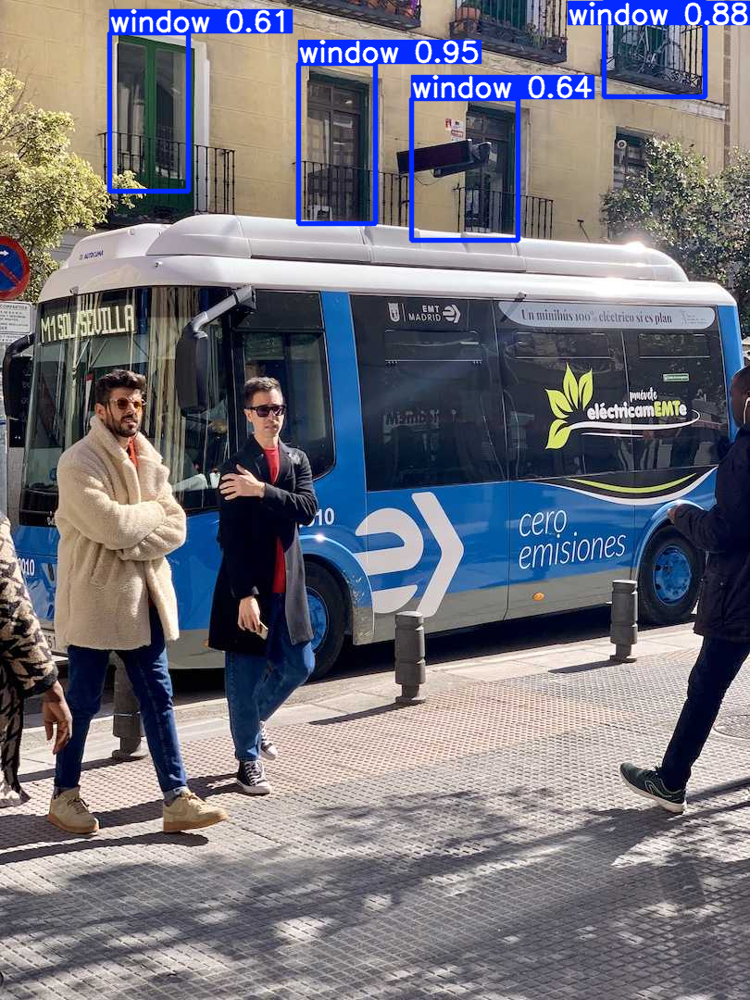

In [ ]:
#import Python Image Library
from PIL import Image

# Determine the image to use to test the model
testImage = 'https://ultralytics.com/images/bus.jpg'
testImage2 = 'windows/images/val/5.jpg'

# Ask the model to make to try to predict objects from an image
prediction2 = model2(testImage)

#Display the picture with the model's predictions
Image.fromarray(prediction2[0].plot()[:,:,::-1])

# III. TRAINING AN AI MODEL WITH DATA FROM ROBOFLOW
Many different sets of training data are available for free online!  Look through the Roboflow website to find some data to use to train an AI model to identify a different object.

## Step 8: Get Annotated Data from Roboflow
Go to universe.roboflow.com and look for a dataset that you are interested in using!
Get the correct download link by clicking on Download > Code > ...

In [ ]:
# Enter the link for Roboflow dataset
# roboflowLink = 'https://universe.roboflow.com/ds/s1qD2lGbQQ?key=AftveLkv3W' #yankees hats
roboflowLink = 'https://universe.roboflow.com/ds/yLY8jcMrjd?key=x4wZHHkWzs' #mario

# Enter the name of the zip file
zipName = "mario.zip"

# Download the Roboflow training data
import urllib.request
urllib.request.urlretrieve(roboflowLink, zipName)

('mario.zip', <http.client.HTTPMessage at 0x78fa4c4e6fe0>)

In [ ]:
# Enter the name of the folder for the new data
zipFolder = "mario"

# Unzip the training data to the new folder
import zipfile
with zipfile.ZipFile(zipName, 'r') as zip_ref:
    zip_ref.extractall(zipFolder)

## Step 9: Start with fresh pre-trained AI model
You can use the same YOLOv8n.pt model from before or use a smaller, faster-to-train model found here. ([Folder of tiny YOLO AI models](https://drive.google.com/drive/folders/1xoEYrBeKtRo8j2vZGR0Cshtff9rOm2S9?usp=sharing) / [GitHub Link](https://github.com/mkturkcan/yolov0))

***Download a fresh AI model from the provided links and upload into the*** content ***folder***

In [ ]:
#Reinstall Ultralytics (Not needed if still in same session from Step 1)
%pip install ultralytics

# Make sure YOLO commands are still loaded
from ultralytics import YOLO

In [ ]:
#Download a smaller pre-trained model
modelLink = 'https://github.com/mkturkcan/yolov0/raw/main/yolov8_femto.pt'

import urllib.request
urllib.request.urlretrieve(modelLink, 'yolov8_femto.pt')

('yolov8_femto.pt', <http.client.HTTPMessage at 0x78fa4c4e6890>)

In [ ]:
# Load a model
model3 = YOLO('yolov8_femto.pt')

## Step 10: Setup the Configuration File for the training data
There should be a `*.yaml` file that was downloaded from your dataset from Roboflow.

**Open that .yaml file and make the following edits:**
1.   Add the first line for a path to the name of the folder where your data images
`path: ../mario`
2.   For the train, val, and test lines, delete the `../` in front of folder names


Good Example:
```
path: ../mario
train: train/images
val: valid/images
test: test/images
```






## Step 11: Train the New AI Model

In [ ]:
# Enter location of config (*.yaml) file
configFile = "mario/data.yaml"

# Train the new model
model3.train(data=configFile, epochs=10, batch=4, imgsz=640)

Ultralytics YOLOv8.2.73 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/best.pt, data=mario/data.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

train: Scanning /content/mario/train/labels.cache... 1527 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1527/1527 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/mario/valid/labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 53 weight(decay=0.0), 60 weight(decay=0.0005), 59 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10     0.545G      1.821      3.463      2.021          5        640: 100%|██████████| 382/382 [00:56<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]

                   all        122        434      0.331      0.299      0.277      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10     0.508G      1.601      2.818      1.785          6        640: 100%|██████████| 382/382 [00:50<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  8.28it/s]

                   all        122        434      0.341      0.413      0.389      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10     0.508G      1.515      2.503      1.695          4        640: 100%|██████████| 382/382 [00:52<00:00,  7.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 12.54it/s]

                   all        122        434      0.418      0.443      0.473      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10     0.508G      1.483      2.284      1.662         13        640: 100%|██████████| 382/382 [00:48<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.09it/s]

                   all        122        434      0.799      0.424      0.542      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10     0.508G      1.453      2.092      1.611         10        640: 100%|██████████| 382/382 [00:48<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.81it/s]

                   all        122        434      0.754      0.444      0.587      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10     0.508G       1.43      2.023      1.601          9        640: 100%|██████████| 382/382 [00:49<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 12.31it/s]

                   all        122        434      0.623      0.461      0.582      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10     0.508G      1.396      1.925      1.573         21        640: 100%|██████████| 382/382 [00:55<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 12.57it/s]

                   all        122        434      0.677      0.539      0.615       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10     0.508G       1.38      1.862       1.56          9        640: 100%|██████████| 382/382 [00:50<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 12.67it/s]

                   all        122        434      0.592      0.576      0.635       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10     0.508G      1.371      1.797      1.553         16        640: 100%|██████████| 382/382 [00:50<00:00,  7.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 12.46it/s]

                   all        122        434      0.523      0.631       0.64      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10     0.508G       1.36      1.753      1.536          7        640: 100%|██████████| 382/382 [00:50<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  9.36it/s]

                   all        122        434      0.532      0.645      0.644      0.377



10 epochs completed in 0.153 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 0.9MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 0.9MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.2.73 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8k summary (fused): 158 layers, 350,697 parameters, 0 gradients, 2.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  5.21it/s]


                   all        122        434      0.533      0.645      0.643      0.376
                 luigi         65        123      0.703      0.911       0.85      0.508
                 mario         79        135      0.534       0.83      0.821      0.505
                 other         51        176      0.361      0.196      0.258      0.116
Speed: 0.5ms preprocess, 4.6ms inference, 0.0ms loss, 6.5ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f966559090>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
#update the model that you're using to be best latest one!
model3 = YOLO('runs/detect/train3/weights/best.pt')


0: 1280x1280 1 luigi, 14.5ms
1: 1280x1280 2 luigis, 4 marios, 2 others, 14.5ms
2: 1280x1280 4 luigis, 6 marios, 1 other, 14.5ms
Speed: 22.3ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 1280, 1280)


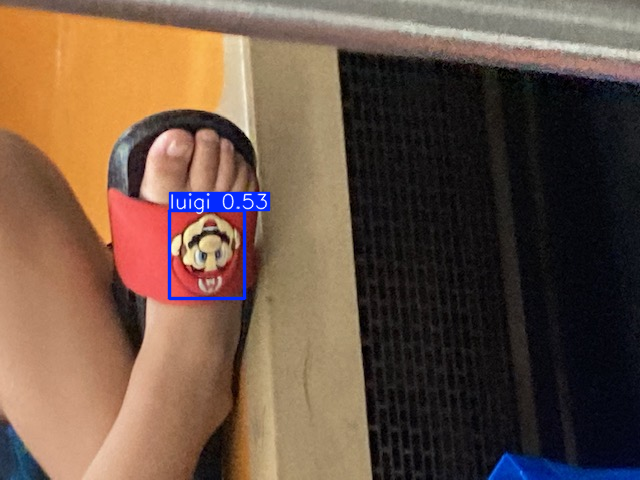

In [ ]:
from PIL import Image
results = model3.predict(['IMG_4546.jpg', 'mario_1.jpg', 'mario_2.jpg'],conf=0.3, imgsz=1280)  # predict on an image
Image.fromarray(results[0].plot()[:,:,::-1])

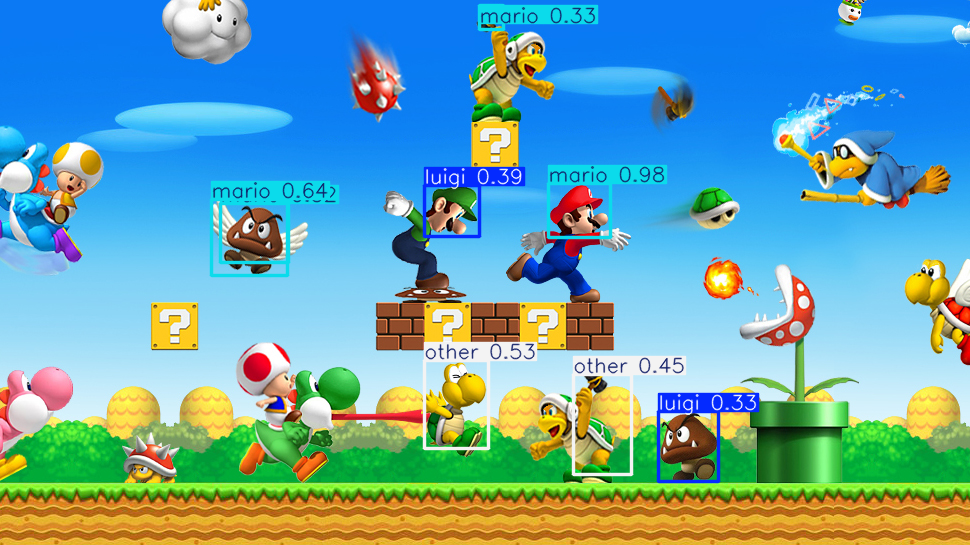

In [ ]:
Image.fromarray(results[1].plot()[:,:,::-1])

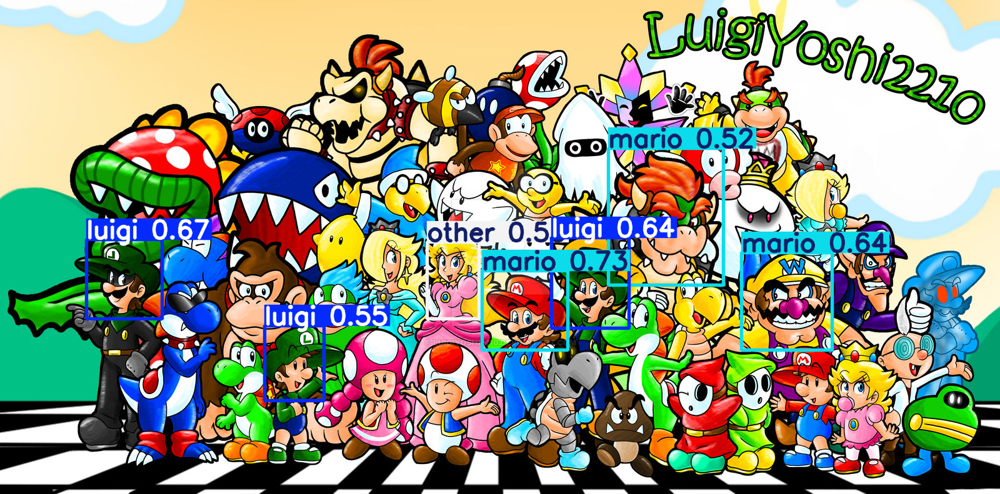

In [ ]:
Image.fromarray(results[2].plot()[:,:,::-1])


image 1/1 /home/jab/Downloads/hats6.webp: 1280x960 (no detections), 1222.3ms
Speed: 39.9ms preprocess, 1222.3ms inference, 5.8ms postprocess per image at shape (1, 3, 1280, 960)


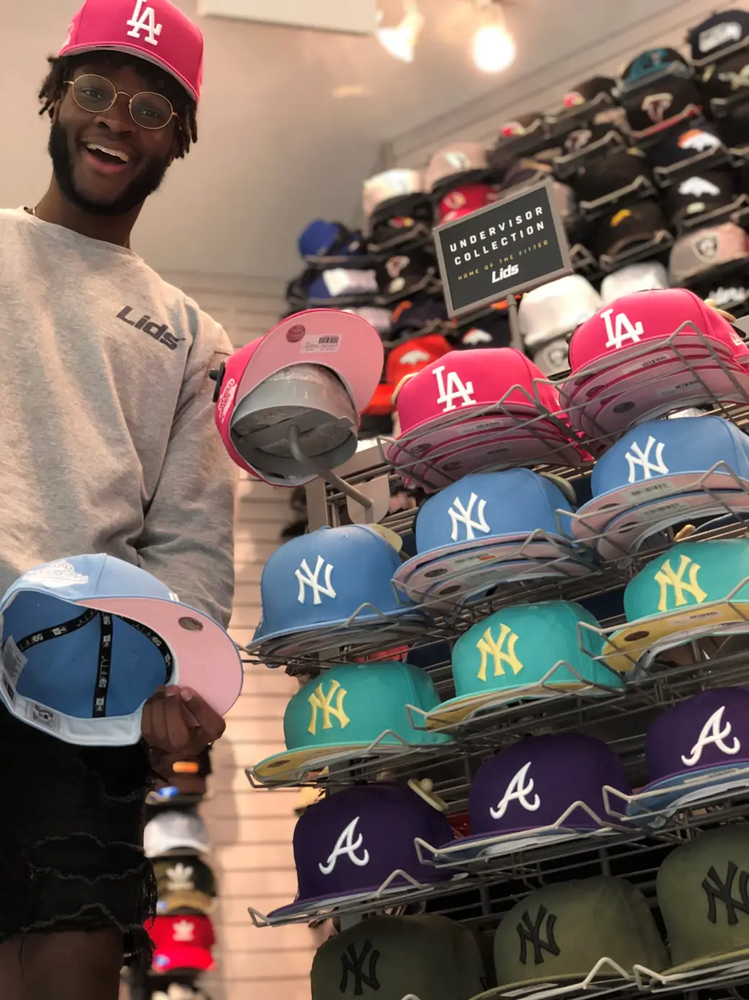

In [ ]:
from PIL import Image
results = model2.predict('hats6.webp',conf=0.1, imgsz=1280)  # predict on an image
Image.fromarray(results[0].plot()[:,:,::-1])

In [ ]:
#Loop through all the test images and run model on them to see what happens

#Look at the output

# IV. TRAINING AI MODEL WITH CUSTOM IMAGE DATA
Training data consists of a series of pictures that have been manually labeled in order to teach AI model what a specific object looks like.  Take your own pictures to create your own set of training data!

## Step 10. Blah Blah Blah

# V.  USING AI MODEL TO INTERACTING WITH REAL-WORLD USING RASPBERRY PI
Now, we can use one of the trained AI models to identify objects in the real world!  With the help of a a small computer (Raspberry Pi) connected to a camera, design a reaction (turn on a light, make a sound, send an email, etc) whenever you see the object your AI model is trained to see.

## Step 12.